In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt

In [ ]:
""" Can turn it to a table (Output variables description)
T2 Total temperature at fan inlet °R
T24 Total temperature at LPC outlet °R
T30 Total temperature at HPC outlet °R
T50 Total temperature at LPT outlet °R
P2 Pressure at fan inlet psia
P15 Total pressure in bypass-duct psia
P30 Total pressure at HPC outlet psia
Nf Physical fan speed rpm
Nc Physical core speed rpm
epr Engine pressure ratio (P50/P2) --
Ps30 Static pressure at HPC outlet psia
phi Ratio of fuel flow to Ps30 pps/psi
NRf Corrected fan speed rpm
NRc Corrected core speed rpm
BPR Bypass Ratio --
farB Burner fuel-air ratio --
htBleed Bleed Enthalpy
Nf_dmd Demanded fan speed rpm
PCNfR_dmd Demanded corrected fan speed rpm
W31 HPT coolant bleed lbm/s
W32 LPT coolant bleed lbm/s"""

In [3]:
output_variables = ['T2','T24','T30','T50','P2','P15','P30','Nf','Nc','epr','Ps30','phi','NRf','NRc','BPR','farB','htBleed','Nf_dmd','PCNfR_dmd','W31','W32']

column_names = ['id','cycle']
features = ['o'+str(n) for n in range(1,4)]
features.extend(output_variables)
column_names.extend(features)
train_files = [f'train_FD00{i}.txt' for i in range(1,5)]

In [4]:
train_dfs = []
for train_file in train_files:    
    train_dfs.append(pd.read_csv(f'data/{train_file}',header=None,sep='\s+',names=column_names))

In [ ]:
#TODO: describe datasets

In [5]:
train_df = train_dfs[2]

In [37]:
train_df

,id,cycle,o1,o2,o3,T2,T24,T30,T50,P2,...,NRf,NRc,BPR,farB,htBleed,Nf_dmd,PCNfR_dmd,W31,W32,RUL
0,1,1,-0.0005,0.0004,100.0,518.67,642.36,1583.23,1396.84,14.62,...,2388.01,8145.32,8.4246,0.03,391,2388,100.0,39.11,23.3537,258
1,1,2,0.0008,-0.0003,100.0,518.67,642.50,1584.69,1396.89,14.62,...,2388.03,8152.85,8.4403,0.03,392,2388,100.0,38.99,23.4491,257
2,1,3,-0.0014,-0.0002,100.0,518.67,642.18,1582.35,1405.61,14.62,...,2388.00,8150.17,8.3901,0.03,391,2388,100.0,38.85,23.3669,256
3,1,4,-0.0020,0.0001,100.0,518.67,642.92,1585.61,1392.27,14.62,...,2388.08,8146.56,8.3878,0.03,392,2388,100.0,38.96,23.2951,255
4,1,5,0.0016,0.0000,100.0,518.67,641.68,1588.63,1397.65,14.62,...,2388.03,8147.80,8.3869,0.03,392,2388,100.0,39.14,23.4583,254
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24715,100,148,-0.0016,-0.0003,100.0,518.67,643.78,1596.01,1424.11,14.62,...,2388.30,8138.08,8.5036,0.03,394,2388,100.0,38.44,22.9631,4
24716,100,149,0.0034,-0.0003,100.0,518.67,643.29,1596.38,1429.14,14.62,...,2388.28,8144.36,8.5174,0.03,395,2388,100.0,38.50,22.9746,3
24717,100,150,-0.0016,0.0004,100.0,518.67,643.84,1604.53,1431.41,14.62,...,2388.24,8135.95,8.5223,0.03,396,2388,100.0,38.39,23.0682,2
24718,100,151,-0.0023,0.0004,100.0,518.67,643.94,1597.56,1426.57,14.62,...,2388.26,8141.24,8.5148,0.03,395,2388,100.0,38.31,23.0753,1


In [6]:
## RUL Calculation ##
max_cycles = train_df.groupby('id').max()['cycle']
rul = train_df.set_index('id')[['cycle']].apply(lambda x: max_cycles[x.name]-x,axis=1)
train_df['RUL'] = rul.values

## Data Exploration

In [7]:
from sklearn.decomposition import PCA, IncrementalPCA
from sklearn.preprocessing import StandardScaler
from mpl_toolkits.mplot3d import Axes3D

In [9]:
scaler = StandardScaler()
# Fit on training set only.
scaler.fit(train_df.drop(['id','RUL'],axis=1))
# Apply transform to both the training set and the test set.
features_set = scaler.transform(train_df.drop(['id','RUL'],axis=1))

In [10]:
pca = PCA(n_components=2)
principalComponents = pd.DataFrame(pca.fit_transform(features_set))

In [11]:
pca.explained_variance_ratio_
print(f'Total explained variance: {np.sum(pca.explained_variance_ratio_):.2%}')

Total explained variance: 66.34%


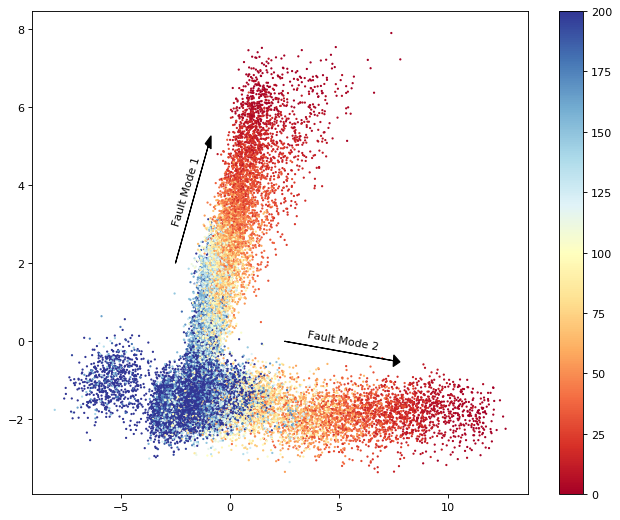

In [12]:
#principalComponents.plot.scatter(1,2,figsize=(12,12))
plt.figure(figsize=(10,8), dpi=80)
cm = plt.cm.get_cmap('RdYlBu')
z = train_df['RUL'].values
sc = plt.scatter(principalComponents[0], principalComponents[1], c=z, vmin=0, vmax=200, s=1, cmap=cm)
plt.colorbar(sc)
plt.text(x=-2.7,y=3,s='Fault Mode 1',rotation=73)
plt.text(x=3.5,y=-0.2,s='Fault Mode 2',rotation=-10)
plt.arrow(-2.5, 2, 1.5, 3,head_width=0.3, head_length=0.3, fc='k', ec='k')
plt.arrow(2.5, 0, 5, -0.5,head_width=0.3, head_length=0.3, fc='k', ec='k')
plt.show()

# Clustering to classify the fault modes

In [33]:
from sklearn.cluster import KMeans,DBSCAN
from sklearn.mixture import GaussianMixture

In [34]:
y_pred = GaussianMixture(n_components=2).fit_predict(principalComponents)

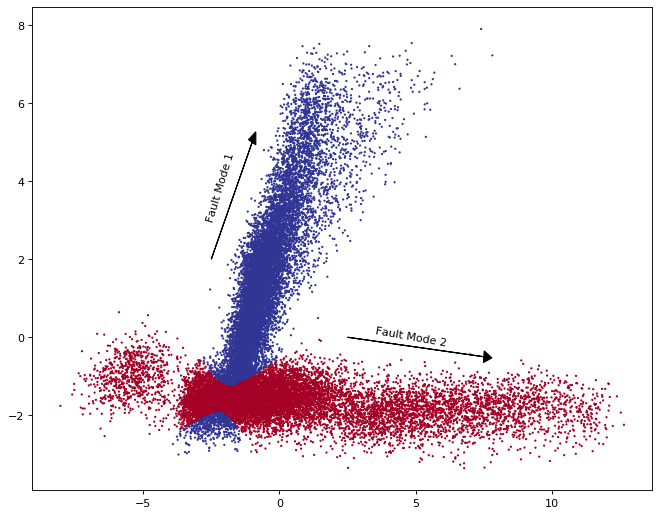

In [36]:
plt.figure(figsize=(10,8), dpi=80)
cm = plt.cm.get_cmap('RdYlBu')
z = y_pred
sc = plt.scatter(principalComponents[0], principalComponents[1], c=z, s=1, cmap=cm)
plt.text(x=-2.7,y=3,s='Fault Mode 1',rotation=73)
plt.text(x=3.5,y=-0.2,s='Fault Mode 2',rotation=-10)
plt.arrow(-2.5, 2, 1.5, 3,head_width=0.3, head_length=0.3, fc='k', ec='k')
plt.arrow(2.5, 0, 5, -0.5,head_width=0.3, head_length=0.3, fc='k', ec='k')
plt.show()

# Some more visulization about the dataset

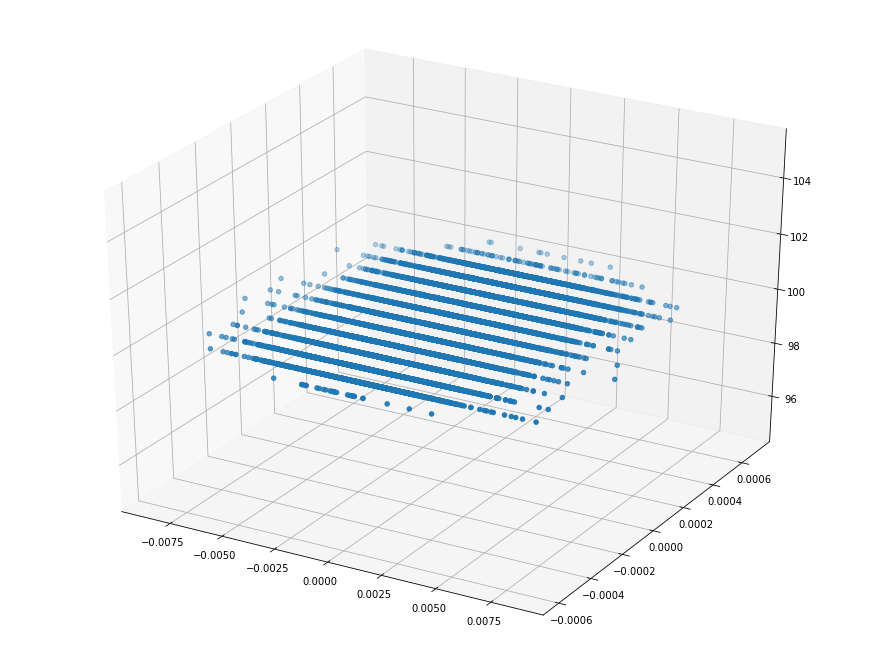

In [74]:
# Operation coditions
fig = plt.figure(figsize=(12, 9))
ax = Axes3D(fig)
cb = ax.scatter(train_df['o1'], train_df['o2'], train_df['o3'])
plt.show()

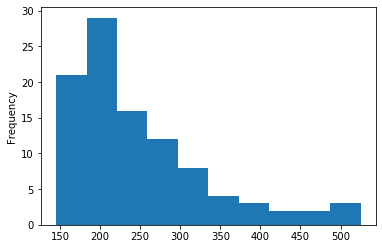

In [75]:
max_cycles.plot.hist()

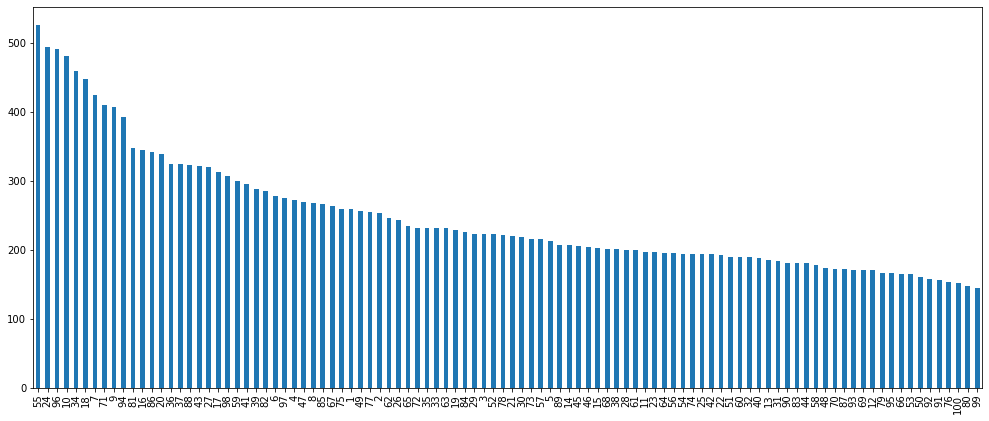

In [76]:
train_df['id'].value_counts().plot.bar(figsize=(17,7));

In [91]:
import seaborn as sns
import matplotlib.pyplot as plt

In [103]:
train_df.set_index('cycle',inplace=True)

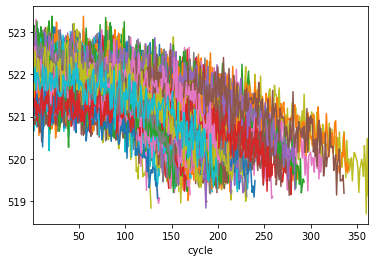

In [107]:
for id in train_df['id'].unique():
    train_df[train_df['id'] == id]['s12'].plot()

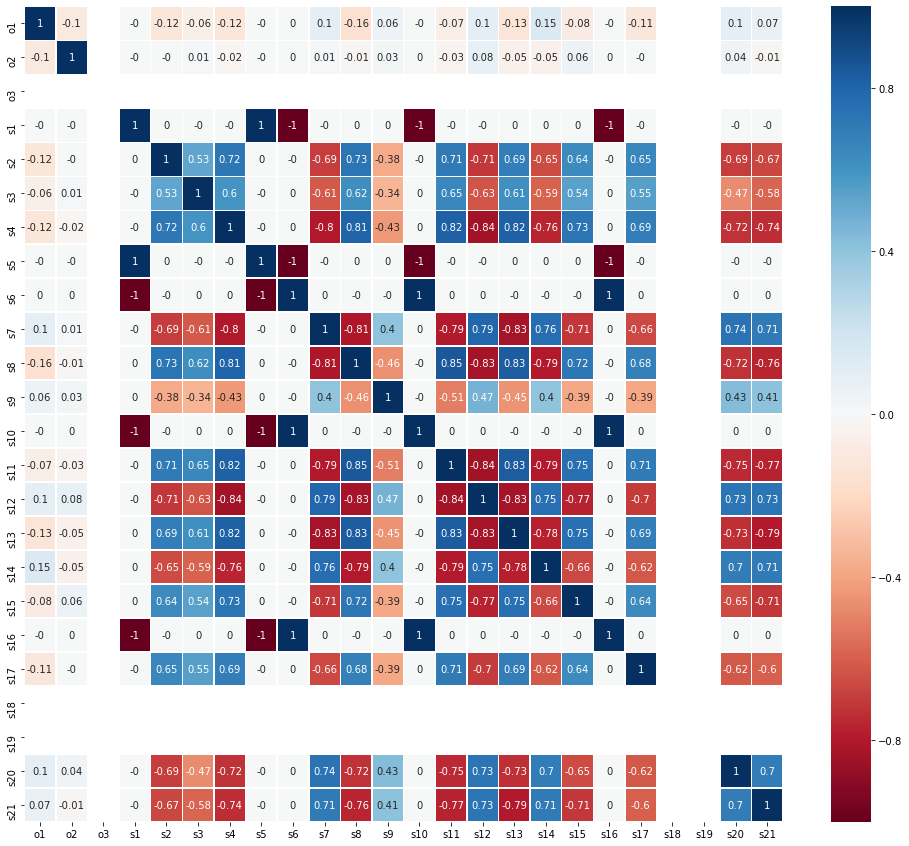

In [94]:
plt.figure(figsize=(17,15))
ax = sns.heatmap(train_df[train_df['id'] == 1][features].corr().round(2),cmap='RdBu',annot=True,linewidth=0.5)